# Gaussian Splatting 2D

In [1]:

import torch
from PIL import Image
import torchvision.transforms as transforms


### Define gaussian class, with mean, and covariance matrix consiting of a rotation matrix and scaling vector



In [2]:

class Gaussian2D:
    def __init__(self, mean, rotation,scale, device='cpu'):
        self.mean = mean
        self.rotation = rotation
        self.scale = scale
        self.device = device
    
    def get_cov(self):
        return self.rotation @ torch.diag(self.scale).float() @ self.rotation.t()
    

def get_rotation_matrix(theta):
    return torch.tensor([[torch.cos(theta), -torch.sin(theta)], [torch.sin(theta), torch.cos(theta)]])





In [3]:
g = Gaussian2D(torch.tensor([0,1]), get_rotation_matrix(torch.tensor(1.7)), torch.tensor([0.1,0.5]))




## Render the gaussian, make 2d grid using torch


In [4]:


def render_gaussian(g, size=100):
    x = torch.linspace(-10, 10, size)
    y = torch.linspace(-10, 10, size)
    X, Y = torch.meshgrid(x, y)
    pos = torch.empty(X.size() + (2,))
    pos[:, :, 0] = X
    pos[:, :, 1] = Y
    pos = pos.to(g.device)
    cov = g.get_cov()
    det = cov[0,0]*cov[1,1] - cov[0,1]*cov[1,0]
    inv = torch.inverse(cov)
    Z = torch.exp(-0.5*torch.einsum('...i,ij,...j->...', pos-g.mean, inv, pos-g.mean))
    Z = Z/torch.sqrt((2*3.1416)**2*det)
    return Z

# render multiple gaussians




def render_gaussians(gaussians, size=100):
    Z = torch.zeros(size, size)
    for g in gaussians:
        Z += render_gaussian(g, size)
    return Z


In [5]:
img = render_gaussian(g)


/home/lars/miniconda3/envs/3D2Face/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


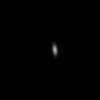

In [6]:
pil_image = transforms.ToPILImage()(img.unsqueeze(0))
display(pil_image)

# Lets try fit a bunch of gaussians to an image

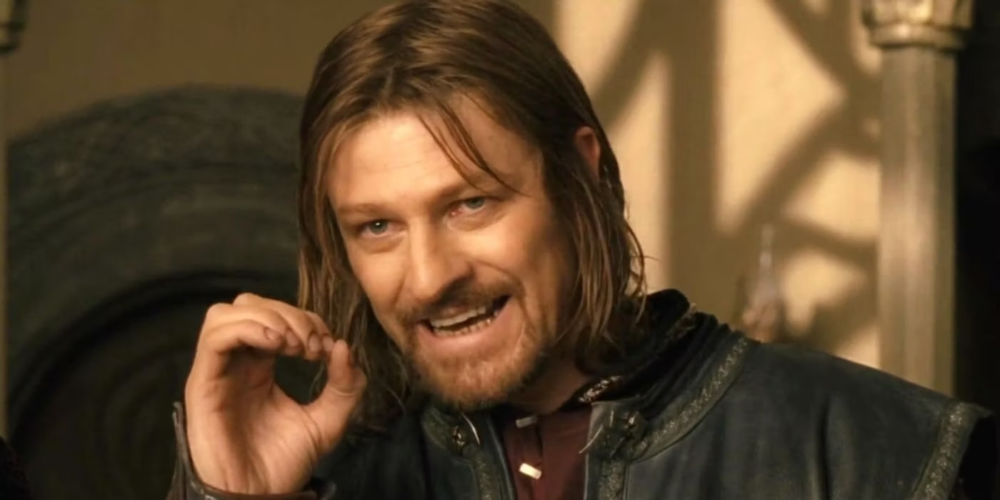

torch.Size([3, 700, 1400])
torch.Size([256, 256, 3])


/home/lars/miniconda3/envs/3D2Face/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


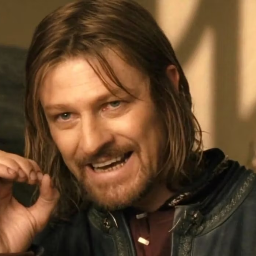

In [7]:
# load the image
import os
images = os.listdir("sample_images")
# chose an image
img_name = images[2]

img = Image.open("sample_images/"+img_name)



#display
display(img)

img = transforms.ToTensor()(img)
print(img.shape)
# resize to 100x100
# crop the center

img = transforms.CenterCrop(img.shape[1])(img)


img = transforms.Resize((256,256))(img)[:,:,:]
img= img.permute(1,2,0)
print(img.shape)


# make a pil image from it and display
pil_image = transforms.ToPILImage()(img.permute(2,0,1))
display(pil_image)

### Define a bunch of gaussians, randomly ditrbuted in a 2 dimensional grid, ranging from 0-100, and with basic rotation and scale




### We want to optimize the parameters of the gaussians to match the image
### So we need to get all the parameters of the gaussians into a couple of tensors


In [8]:
num_gaussians=1000
gaussians =[]
for i in range(num_gaussians):
    #random init
    g = Gaussian2D(torch.tensor([(torch.rand(1)*256),(torch.rand(1)*256)]), get_rotation_matrix(torch.tensor([0])), torch.tensor([1.0,1.0]))

    gaussians.append(g)


means = torch.tensor(torch.rand(num_gaussians,2)*100, requires_grad=True,device="cuda")
rotations = torch.stack([g.rotation for g in gaussians]).clone().to("cuda").requires_grad_(True)
scales = torch.rand(num_gaussians,2, requires_grad=True,device="cuda")
colors = torch.rand(num_gaussians,3, requires_grad=True,device="cuda")

/tmp/ipykernel_14511/1496397601.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  means = torch.tensor(torch.rand(num_gaussians,2)*100, requires_grad=True,device="cuda")



### Define Gaussian rendering function, and make it support batches of gaussians.


In [9]:


import torch


def get_covariance_batch(rotations, scales):
    # Assuming rotations is of shape [batch_size, 2, 2]
    # and scales is of shape [batch_size, 2]
    scales_matrix = torch.diag_embed(scales)  # Now supports batch operation
    return rotations.matmul(scales_matrix).matmul(scales_matrix.transpose(-2, -1)).matmul(rotations.transpose(-2, -1))

def render_gaussian_color_batch(means, covs, colors, size=100):
    # Create the grid
    device = means.device
    x = torch.linspace(0, 100, size).to(device)
    y = torch.linspace(0, 100, size).to(device)
    X, Y = torch.meshgrid(x, y, indexing='ij')
    pos = torch.stack([X.repeat(means.size(0), 1, 1), Y.repeat(means.size(0), 1, 1)], dim=-1).to(device)

    # Adjust means and covariances for batch operation
    means = means.unsqueeze(-2).unsqueeze(-2)

    eps = 1e-6
    covs += eps * torch.eye(covs.size(-1), device=covs.device).expand_as(covs)
    inv_covs = torch.linalg.inv(covs)
    det_covs = torch.linalg.det(covs)
    
    # Compute the Gaussian function
    diff = pos - means
    exponent = torch.einsum('bijk,bkl,bijl->bij', diff, inv_covs, diff)
    exponent = torch.clamp(exponent, min=-100, max=100)
    Z = torch.exp(-0.5 * exponent)
    normalization = 1  # Adjust as needed for proper normalization
    Z = Z / normalization

    # Initialize an RGB image
    img = torch.zeros((size, size, 3), device=device)

    # compute the color for each gaussian, its eaqual to the gaussain value times the color
    # do it using matrix multiplication
    colors = colors.unsqueeze(-2).unsqueeze(-2).to(device)
    img = (Z[..., None] * colors).sum(dim=0)

    # Normalize the image to keep pixel values between 0 and 1
    img = img / torch.max(img)

    return img



### Training loop for optimizing the paramters, lets do a 1000 iterations 
##### Note that the mean is defined in the range 0-100, so the learning for the mean is higher to adjust for this.


/home/lars/miniconda3/envs/3D2Face/lib/python3.10/site-packages/pytorch_msssim/ssim.py:50: UserWarning: Skipping Gaussian Smoothing at dimension 2+1 for input: torch.Size([1, 256, 256, 3]) and win size: 11
  warnings.warn(


0.0018853311240673064


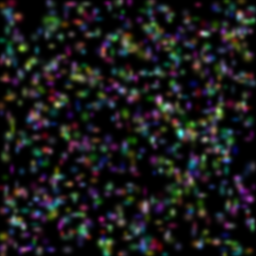

0.03638021126389503


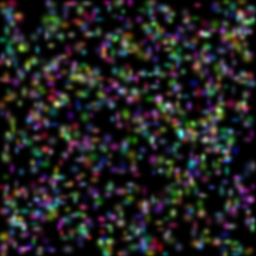

0.03358685702085495


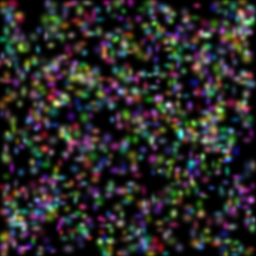

0.030401681065559388


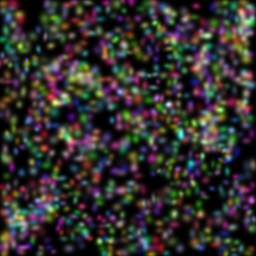

0.027059168815612794


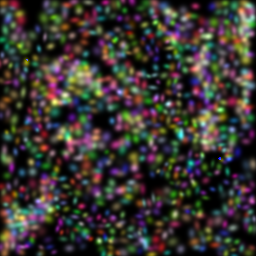

In [10]:

import torch.optim as optim
import torch.nn.functional as F

from pytorch_msssim import ssim, ms_ssim, SSIM, MS_SSIM


optimizer = optimizer = optim.Adam([
    {'params': means, 'lr': 0.01},
    {'params': rotations, 'lr': 0.001},
    {'params': scales, 'lr': 0.001},
    {'params': colors, 'lr': 0.001}
])

epoch_loss = 0
for i in range(1000):
    optimizer.zero_grad()
    covs = get_covariance_batch(rotations, torch.nn.functional.softplus(scales))
    img_ = render_gaussian_color_batch(means, covs, colors, size=256)
    # normalize to 0,1
    img_ = img_/torch.max(img_)
    mse_loss = F.l1_loss(img_, img.squeeze(2).to("cuda")) 
    # we need to convert to 3 channels, and add a batch dimension, so lets just repeat the image 3 times channels first
    ssim_loss = 1- ssim(img_.unsqueeze(0), img.unsqueeze(0).to("cuda"))
    loss = 0.8*mse_loss + 0.2*ssim_loss
    epoch_loss += loss.item()
    loss.backward()
    optimizer.step()
    if i % 20 == 0:
        # print(means)
        print(epoch_loss/100)
        epoch_loss = 0
        pil_image = transforms.ToPILImage()(img_.permute(2,0,1))
        display(pil_image)
        # save image to file directory with image_name
        if not os.path.exists("output_images"):
            os.makedirs("output_images")
        image_name = os.path.splitext(img_name)[0]
        if not os.path.exists("output_images//{}".format(image_name)):
            os.makedirs("output_images/{}".format(image_name))
        pil_image.save("output_images/{}/{}.png".format(image_name, i))



## Visualizing the results

#### Make a video of the optimization progression for the images


In [249]:

import cv2
import os
import numpy as np
import imageio

def create_video_from_frames(frames_folder, output_video_path):
    frames = [os.path.join(frames_folder, f) for f in sorted(os.listdir(frames_folder), key=lambda x: int(x.split('.')[0])) if f.endswith('.png')]
    frame = cv2.imread(frames[0])
    height, width, layers = frame.shape
    video = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), 10, (width, height))

    for frame in frames:
        video.write(cv2.imread(frame))
    
    video.release()

def combine_videos_to_grid(video_paths, output_grid_path):
    clips = [cv2.VideoCapture(path) for path in video_paths]
    frames = []
    while True:
        imgs = []
        for clip in clips:
            ret, frame = clip.read()
            if not ret:
                break
            imgs.append(frame)
        if len(imgs) < len(clips):
            break
        top = np.concatenate(imgs[:2], axis=1)
        bottom = np.concatenate(imgs[2:], axis=1)
        grid = np.concatenate([top, bottom], axis=0)
        frames.append(grid)

    height, width, layers = frames[0].shape
    video = cv2.VideoWriter(output_grid_path, cv2.VideoWriter_fourcc(*'mp4v'), 10, (width, height))
    for frame in frames:
        video.write(frame)
    video.release()

def video_to_gif(video_path, gif_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    imageio.mimsave(gif_path, frames, fps=5)

# Paths to the subfolders
subfolders = ["output_images/Boromir", "output_images/Musk", "output_images/Fuji", "output_images/Akira"]

videos = []
for i, folder in enumerate(subfolders):
    output_video_path = f'video_{i}.mp4'
    create_video_from_frames(folder, output_video_path)
    videos.append(output_video_path)

output_grid_path = 'grid_video.mp4'
combine_videos_to_grid(videos, output_grid_path)

gif_path = 'final_grid.gif'
video_to_gif(output_grid_path, gif_path)


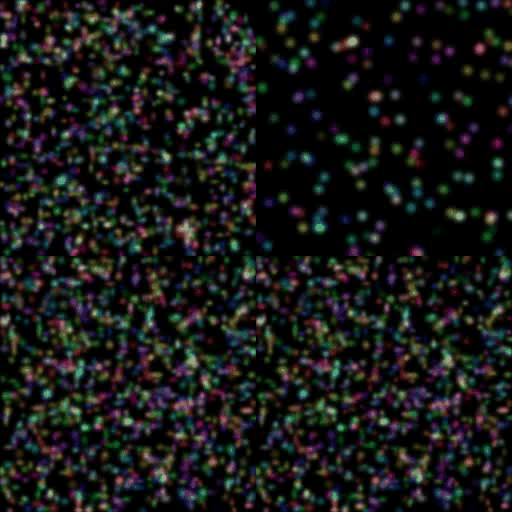

In [250]:
# display the gif

from IPython.display import Image
Image(filename=gif_path)
